# Исследование рынка заведений общественного питания Москвы

## Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Цель - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Загрузка данных и изучение общей информации 

In [1]:
#импорт библиотек 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["figure.figsize"] = (15,5)
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

In [2]:
#чтение файла 
path = '/datasets/moscow_places.csv'
data = pd.read_csv(path)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
#вывод общей информации о датафрейме 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Вывод: импортированы необходимые библиотеки, выведена общая информация о датафрейме, всего в датафрейме 8406 строк, типы данных float, int, object. 

## Предобработка данных

In [4]:
#проверка наличия явных дубликатов 
data.duplicated().sum()

0

In [5]:
#проверка на наличие неявных дубликатов 
data.duplicated(subset=['name', 'address']).sum()
print(len(data))

8406


In [6]:
#удаление неявных дубликатов 
data = data.drop_duplicates(subset=['name', 'address'])
print(len(data))

8406


In [7]:
#вывод пропущенных значений датафрейма 
data.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Рабочие часы и количество мест зависит от помещения и от условий компаний. Столбцы middle_avg_bill и middle_coffee_cup не могут быть заполнены из-за отсутствия статистики, столбец middle_coffee_cup тоже нужно оставить незаполенным, так как много заведений не относится к категории "кофейня". 

In [8]:
#создание столбца 'street' с названиями улиц из столбца с адресом
street = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join('улица'))
data["street"] = data["address"].str.extract(street)

In [9]:
#создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data['is_24/7'] = data['is_24/7'].fillna(False)

In [10]:
#вывод датафрейма после добавления столбцов 
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [11]:
#фильтрация значений, начинающиеся со слов "средний счёт":
avg_bill_new = data.groupby('avg_bill')['middle_avg_bill'].max().dropna()
display(avg_bill_new.index)
display(avg_bill_new.head())

Index(['Средний счёт:100 ₽', 'Средний счёт:1000 ₽',
       'Средний счёт:1000–10000 ₽', 'Средний счёт:1000–1100 ₽',
       'Средний счёт:1000–1200 ₽', 'Средний счёт:1000–1300 ₽',
       'Средний счёт:1000–1350 ₽', 'Средний счёт:1000–1400 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1000–1600 ₽',
       ...
       'Средний счёт:от 499 ₽', 'Средний счёт:от 50 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:от 5000 ₽',
       'Средний счёт:от 549 ₽', 'Средний счёт:от 600 ₽',
       'Средний счёт:от 650 ₽', 'Средний счёт:от 700 ₽',
       'Средний счёт:от 800 ₽', 'Средний счёт:от 850 ₽'],
      dtype='object', name='avg_bill', length=555)

avg_bill
Средний счёт:100 ₽            100.0
Средний счёт:1000 ₽          1000.0
Средний счёт:1000–10000 ₽    5500.0
Средний счёт:1000–1100 ₽     1050.0
Средний счёт:1000–1200 ₽     1100.0
Name: middle_avg_bill, dtype: float64

In [12]:
#замена пропусков по совпадению в списке в столбце 'middle_avg_bill'
def func_avg(avg_bill):
    if avg_bill in avg_bill_new:
        return avg_bill_new[avg_bill]
data.loc[data['middle_avg_bill'].isna(), 'middle_avg_bill'] = data['avg_bill'].apply(func_avg)

In [13]:
#проверка пропусков после замены 
data.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
street               3107
is_24/7                 0
dtype: int64

In [14]:
#просмотр значений столбца 'seats'
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

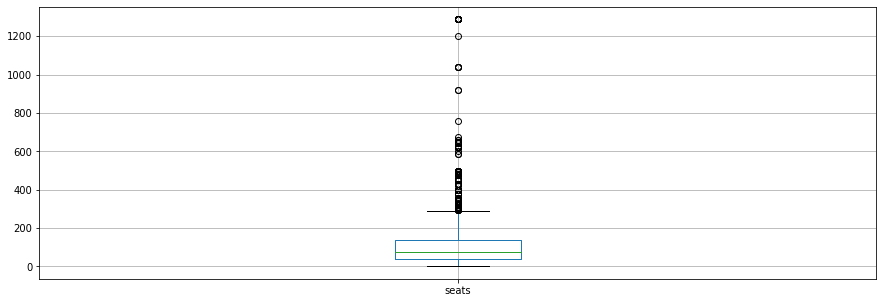

In [15]:
#проверка выбросов столбца 'seats'
data.boxplot(column = 'seats')
plt.show()

Исходя из графика видно, что есть много выбросов, предлагаю считать все значения, более 550 посадочных мест - выбросами, и сделать фильтрацию по этому значению. 

In [16]:
#фильтрация данных от выбросов 
data = data[data['seats'] <= 550]

### Общие выводы по разделу
В результате предобработки данных датафрейм проверен на наличие явных дубликатов, на наличие пропущенных значений, выявлены пропущенные значения столбцов 'hours', 'price', 'avg_bill', 'middlle_avg_bill', 'middle_coffee_cup', 'street', пропущенные значения оставлены, для того, чтобы избежать искажения в данных, создан столбец 'street' с наименованиями улиц, создан столбец 'is_24_7' с обозначением времени работы заведения (ежедневно и круглосуточно), также проверены выбросы столбца seats, произведена фильтрация. 

# Анализ данных

In [17]:
#исследование количества объектов общественного питания по категориям
name_category = data.groupby('category')['name'].count().sort_values(ascending = False).reset_index()
name_category.columns = ['category', 'count']
name_category

,category,count
0,ресторан,1258
1,кафе,1204
2,кофейня,739
3,"бар,паб",458
4,пиццерия,423
5,быстрое питание,348
6,столовая,162
7,булочная,147


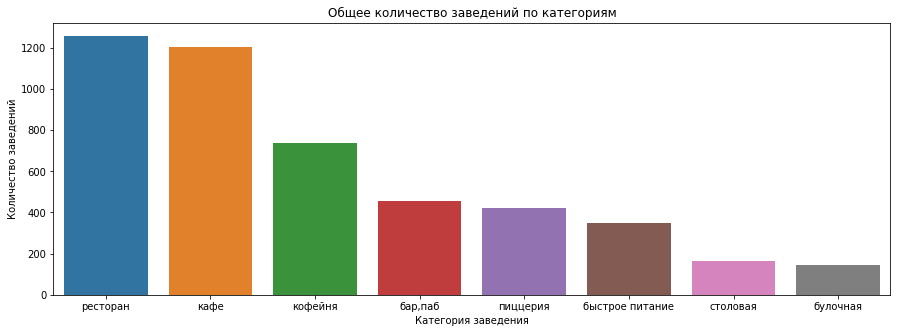

In [18]:
#построение графика количества объектов общественного питания по категориям
sns.barplot(x=name_category['category'],y=name_category['count'])
plt.title('Общее количество заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.show()

Вывод: больше всего заведений в Москве относится к категории рестораны, кафе, кофейня, бар, паб, пиццерия. Количество ресторанов составляет 1258, количество кафе 1204, количество кофеин 739, количество баров и пабов 458, количество пиццерий 423. 

In [19]:
#исследование количества посадочных мест в местах по категориям
seat_category = data.groupby('category')['seats'].median().round(1).sort_values(ascending = False).reset_index()
seat_category.columns = ['category', 'median']
seat_category

,category,median
0,ресторан,86.0
1,"бар,паб",80.0
2,кофейня,78.0
3,столовая,75.0
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,52.0
7,булочная,50.0


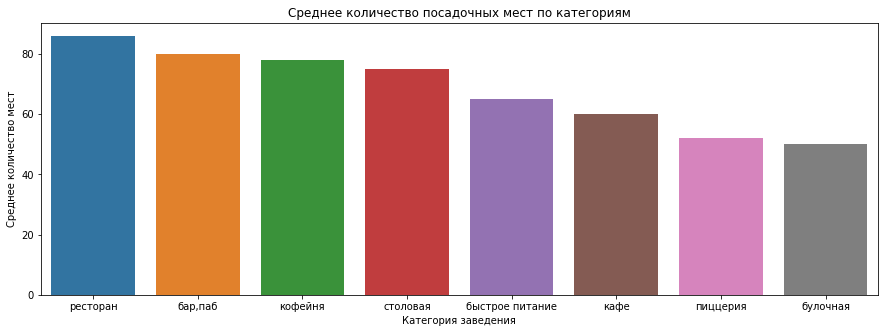

In [20]:
#построение графика количества посадочных мест в местах по категориям
sns.barplot(x=seat_category['category'],y=seat_category['median'])
plt.title('Среднее количество посадочных мест по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Среднее количество мест')
plt.show()

Вывод: Большее количество посадочных мест в среднем приходится на заведения категорий ресторан (среднее количество мест составляет 86), бар и паб (среднее количество мест составляет 80), кофейня (среднее количество мест составляет 78). 

In [21]:
#исследование соотношения сетевых и несетевых заведений
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,2838
1,1,1901


In [22]:
#построение графика соотношения сетевых и несетвых заведений
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

Вывод: Больше всего заведений являются несетевыми (количество несетевых заведений составляет 2838, отношение от общего количества заведений составляет 59,9%), остальные заведения - сетевые (количество сетевых заведений составляет 1901, отношение от общего количества заведений составляет 40,1%).  

In [23]:
#исследование категории сетевых и несетвых заведений
chain_category = data.groupby(['category', 'chain'])['name'].count().sort_values(ascending = False).reset_index()
chain_category.columns = ['type', 'chain', 'count']
chain_category

,type,chain,count
0,ресторан,0,803
1,кафе,0,780
2,ресторан,1,455
3,кафе,1,424
4,кофейня,1,402
5,"бар,паб",0,348
6,кофейня,0,337
7,пиццерия,1,246
8,быстрое питание,0,219
9,пиццерия,0,177


In [24]:
#построение графика категории сетевых и несетвых заведений
fig = px.bar(chain_category,
             x='count',
             y='type',
             text= 'count',
             color='chain',
             category_orders={"chain":['сетевой', 'несетевой']},
             color_discrete_sequence=["#FF97FF", "#FECB52"],
             height=500,
             width=700
             )
fig.update_layout(title = 'Соотношение сетевых и несетевых заведений',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Категории')
fig.show()

Вывод: Рестораны, кафе, кофейня чаще являются сетевыми. Всего в Москве 455 сетевых ресторанов, 424 сетевых кафе, 402 сетевых кофейни.  

In [25]:
#исследование категорий сетевых и несетевых заведений по относительному показателю
chain_data_group = data[data['chain'] == 1].groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)
not_chain_data_group = data[data['chain'] == 0].groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)

In [26]:
chain_not_chain_data = pd.concat([chain_data_group, not_chain_data_group], axis = 1)
chain_not_chain_data.columns = ['category', 'chain', 'category', 'not_chain']
chain_not_chain_data['perc'] = chain_not_chain_data['chain'] / chain_not_chain_data['not_chain']
chain_not_chain_data 

,category,chain,category,not_chain,perc
0,"бар,паб",110,"бар,паб",348,0.316092
1,булочная,92,булочная,55,1.672727
2,быстрое питание,129,быстрое питание,219,0.589041
3,кафе,424,кафе,780,0.543590
4,кофейня,402,кофейня,337,1.192878
5,пиццерия,246,пиццерия,177,1.389831
6,ресторан,455,ресторан,803,0.566625
7,столовая,43,столовая,119,0.361345


Вывод: в заведениях категорий булочная, кофейня, пиццерия преобладают именно тип сетевых заведений. 

In [27]:
#исследование топ-15 популярных сетей в Москве по наименованием заведений и их категориями 
data_chain = data[data['chain'] == 1]
top_15 = data_chain.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,Шоколадница,4.20,кофейня,81
1,Додо Пицца,4.30,пиццерия,62
2,Домино'с Пицца,4.20,пиццерия,61
3,One Price Coffee,4.10,кофейня,51
4,Cofix,4.10,кофейня,36
5,Яндекс Лавка,4.00,ресторан,34
6,Prime,4.20,ресторан,33
7,Хинкальная,4.35,"[кафе, ресторан]",32
8,Теремок,4.10,ресторан,27
9,Кулинарная лавка братьев Караваевых,4.40,кафе,26


In [28]:
#построение графика топ-15 популярных сетей в Москве по наименованием заведений и их категориями 
fig = px.bar(top_15,
             x='count',
             y='name',
             text= 'count',
             color='name',
             height=500,
             width=700
             )
fig.update_layout(title = 'Топ-15 популярных заведений Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Категории')
fig.show()

Вывод: самыми популярными сетевыми заведениями являются Шоколадница, Додо Пицца, Домино'с пицца, One Price Coffee, Coffix. Эти заведения относятся к категории кофеен и пиццерий. 

In [29]:
#вывод уникальных значений столбца 'district'
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Западный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [30]:
#исследование распределения количества заведений по категориям в рамках административных округов 
district_category = data.groupby(['district', 'category'])['name'].count().sort_values(ascending = False).reset_index()
district_category.columns = ['district', 'category', 'count']
district_category.head(10)

,district,category,count
0,Центральный административный округ,ресторан,370
1,Центральный административный округ,кафе,233
2,Центральный административный округ,кофейня,218
3,Центральный административный округ,"бар,паб",189
4,Южный административный округ,кафе,151
5,Северо-Восточный административный округ,кафе,146
6,Северный административный округ,кафе,137
7,Южный административный округ,ресторан,134
8,Юго-Западный административный округ,кафе,133
9,Западный административный округ,ресторан,130


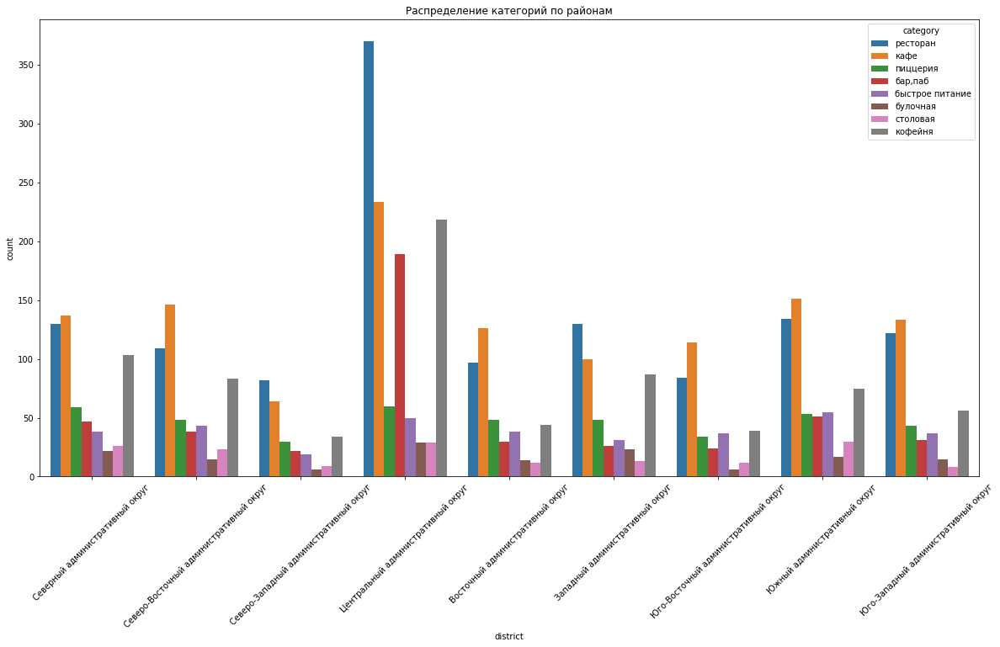

In [31]:
#построение графика распределения количества заведений по категориям в рамках административных округов 
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='category', data=data)
plt.xticks(rotation=45)
plt.title('Распределение категорий по районам')
plt.show()

Вывод: наиболее популярными районами Москвы по количеству заведений являются Центральный АО, Южный АО, Северо-Восточный АО, Северный АО, Юго-западный АО. 

In [32]:
#исследование средних рейтингов заведений в зависимости от их категорий
mean_rating_category = data.groupby('category')['rating'].mean().round(2).sort_values(ascending = False).reset_index()
mean_rating_category.columns = ['category', 'mean']
mean_rating_category

,category,mean
0,"бар,паб",4.39
1,ресторан,4.29
2,кофейня,4.28
3,пиццерия,4.28
4,булочная,4.26
5,столовая,4.24
6,кафе,4.15
7,быстрое питание,4.04


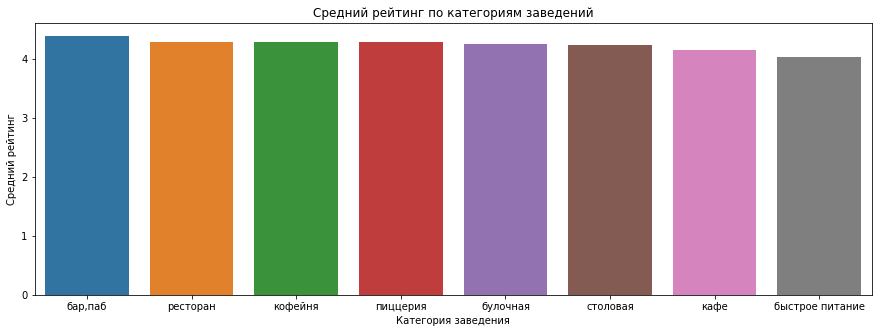

In [33]:
#построение графика средних рейтингов заведений в зависимости от их категорий
sns.barplot(x=mean_rating_category['category'],y=mean_rating_category['mean'])
plt.title('Средний рейтинг по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.show()

Вывод: Усреднённые рейтинги в разных типах общепита отличаются не особо сильно, так, например самый высокий рейтинг бар, паб составляет 4.39, а самый низкий рейтинг быстрого питания 4.04. 

In [34]:
#исследование распределения средних рейтингов по категориям заведений в рамках административных округов Москвы
data_rating = data.groupby('district')['rating'].agg('mean').round(2).sort_values(ascending = False).reset_index()
data_rating.columns = ['district', 'rating']
data_rating

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.25
2,Восточный административный округ,4.22
3,Северо-Западный административный округ,4.21
4,Юго-Западный административный округ,4.21
5,Западный административный округ,4.19
6,Северо-Восточный административный округ,4.18
7,Южный административный округ,4.18
8,Юго-Восточный административный округ,4.12


In [35]:
#импорт библиотек для работы с картографией 
import folium
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from folium import Marker

In [36]:
#построение графика распределения средних рейтингов по категориям заведений в рамках административных округов Москвы

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#создание хороплета с помощью конструктора Choropleth и добавление его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# вывод карты
m

Вывод: заведения с самым высокий рейтингом очевидно приходятся на Центральный АО, далее следует Северный АО, Восточный АО, Северо-Западный АО, Юго-Западный АО. 

In [37]:
#отображения всех заведений датасета на карте с помощью кластеров 

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создание карты Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создание пустого кластера и добавление его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

In [38]:
#нахождение топ-15 улиц по количеству заведений 
top_15_street = data.groupby('street').agg({'street' : 'count'})
top_15_street = top_15_street.rename(columns={'street':'count'})
top_15_street = top_15_street.sort_values('count', ascending = False).reset_index().head(15)
top_15_street

,street,count
0,Профсоюзная улица,91
1,проспект Мира,89
2,улица Миклухо-Маклая,45
3,Люблинская улица,39
4,улица Вавилова,36
5,проспект Андропова,35
6,Ярцевская улица,34
7,Лесная улица,32
8,Пятницкая улица,29
9,Усачёва улица,29


In [39]:
#построение графика топ-15 популярных улиц Москвы по количеству заведений 
fig = px.bar(top_15_street,
             x='count',
             y='street',
             text= 'count',
             color='street',
             height=500,
             width=700
             )
fig.update_layout(title = 'Топ-15 популярных улиц Москвы по количеству заведений',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'наименование улиц')
fig.show()

Вывод: самыми популярными улицами Москвы по количеству заведений являются Профсоюзная улица (количество заведений составляет 91), далее проспект Мира (количество заведений составляет 89), далее улица Миклухо-Маклая (количество заведений составляет 45), далее Люблинская улица (количество заведений составляет 39), далее улица Вавилова (количество заведений 36). 

In [40]:
#разбивка популярных улиц по категориям 
streets_category = data.groupby(['street', 'category'])['name'].count().sort_values(ascending = False).reset_index()
streets_category.columns = ['street', 'category', 'count']
streets_category.head(10)

,street,category,count
0,проспект Мира,ресторан,24
1,Профсоюзная улица,кафе,24
2,проспект Мира,кофейня,22
3,улица Миклухо-Маклая,кафе,18
4,Люблинская улица,кафе,18
5,Профсоюзная улица,ресторан,18
6,проспект Мира,кафе,17
7,проспект Андропова,ресторан,15
8,Профсоюзная улица,кофейня,14
9,улица Миклухо-Маклая,ресторан,14


Вывод: заведения на популярных улицах Москвы относятся к категории ресторан, кафе, кофейня. 

In [41]:
#нахождение улиц, на которых находится только один объект общепита (непопулярые улицы)
one_cafe_street = data['street'].value_counts().reset_index()
one_cafe_street.columns = ['street', 'count']
one_cafe_street = one_cafe_street[one_cafe_street['count']==1]
one_cafe_street

,street,count
438,Новозаводская улица,1
439,Новомосковская улица,1
440,улица Кашёнкин Луг,1
441,Полимерная улица,1
442,16-я Парковая улица,1
...,...,...
635,Изумрудная улица,1
636,Платовская улица,1
637,улица Клочкова,1
638,Новороссийская улица,1


In [42]:
#нахождение категорий заведений непопулярных улиц 
street_category = streets_category[streets_category['street'].isin(one_cafe_street['street'])]
street_category = street_category.groupby('category')['street'].count().sort_values(ascending=False)
street_category

category
ресторан           63
кафе               49
кофейня            24
бар,паб            17
столовая           16
пиццерия           13
быстрое питание    11
булочная            9
Name: street, dtype: int64

Вывод: заведения на непопулярных улицах Москвы относят к категории ресторан, кафе, кофейня, бар, паб. Вероятнее всего, на этих улицах мало альтернатив, но заведения также пользуются популярностью у жителей, проживающих в данных районах.

In [43]:
#исследование значений средних чеков в разрезе административных округов Москвы 
middle_bill = data.groupby('district')['middle_avg_bill'].median().sort_values(ascending = False).reset_index()
middle_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,750.0
3,Юго-Западный административный округ,675.0
4,Восточный административный округ,650.0
5,Северный административный округ,627.5
6,Северо-Восточный административный округ,500.0
7,Юго-Восточный административный округ,500.0
8,Южный административный округ,500.0


In [44]:
#построение хороплета средних чеков в разрезе административных округов Москвы

# создаем карту Москвы
map_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = middle_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Средний чек заведений по районам',
).add_to(map_2)

map_2

Выводы: самый высокий средний чек приходится на заведения, находящихся в таких районах как Западный АО, Центральный АО, Северо-Западный АО, Юго-западный АО, Восточный АО. 

### Общие выводы по разделу:
1. Больше всего заведений в Москве относится к категории ресторны, кафе, кофейня, бар, паб, пиццерия. Количество ресторанов составляет 1258, количество кафе 1204, количество кофейн 739, количество баров и пабов 458, количество пиццерий 423.
2. Большее количество посадочных мест в среднем приходится на заведения категорий ресторан (среднее количество мест составляет 86), бар и паб (среднее количество мест составляет 80), кофейня (среднее количество мест составляет 78).
3. Больше всего заведений являются несетевыми (количество несетевых заведений составляет 2838, отношение от общего количества заведений составляет 59,9%), остальные заведения - сетевые (количество сетевых заведений составляет 1901, отношение от общего количества заведений составляет 40,1%).
4. Рестораны, кафе, кофейня чаще являются сетевыми. Всего в Москве 455 сетевых ресторанов, 424 сетевых кафе, 402 сетевых кофейни.
5. Самыми популярными сетевыми заведениями являются Шоколадница, Додо Пицца, Домино'с пицца, One Price Coffee, Coffix. Эти заведения относятся к категории кофеен и пиццерий.
6. Наиболее популярными районами Москвы по количеству заведений являются Центральный АО, Южный АО, Северо-Восточный АО, Северный АО, Юго-западный АО.
7. Усреднённые рейтинги в разных типах общепита отличаются не особо сильно, так, например самый высокий рейтинг бар, паб составляет 4.39, а самый низкий рейтинг быстрого питания 4.04.
8. Заведения с самым высокий рейтингом очевидно приходятся на Центральный АО, далее следует Северный АО, Восточный АО, Северо-Западный АО, Юго-Западный АО.
9. Самыми популярными улицами Москвы по количеству заведений являются Профсоюзная улица (количество заведений составляет 91), далее проспект Мира (количество заведений составляет 89), далее улица Миклухо-Маклая (количество заведений составляет 45), далее Люблинская улица (количество заведений составляет 39), далее улица Вавилова (количество заведений 36). заведения на популярных улицах Москвы относятся к категории ресторан, кафе, кофейня.
10. Заведения на непопулярных улицах Москвы относят к категории ресторан, кафе, кофейня, бар, паб. Вероятнее всего, на этих улицах мало альтернатив, но заведения также пользуются популярностью у жителей, проживающих в данных районах.
11. Самый высокий средний чек приходится на заведения, находящихся в таких районах как Западный АО, Центральный АО, Северо-Западный АО, Юго-западный АО, Восточный АО. 

## Детализация исследования

In [45]:
#общее количество кофеен в датасете 
coffee = data[data['category'] == 'кофейня']
print('Общее количество кофеин:', len(coffee))

Общее количество кофеин: 739


In [46]:
#местонахождение кофеен в Москве 

# создаем карту
map_3= Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_3)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
map_3

In [47]:
#нахождение количества круглосуточных кофеен в Москве 
coffee_24_7 = coffee[coffee['is_24/7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_24_7))

Количество круглосуточных кофеен: 37


In [48]:
#расположение круглосуточных кофеен в Москве 

# создаём карту Москвы
map_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
map_4

In [49]:
#нахождение рейтингов кофеен в Москве 
coffee_rating = coffee.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.32
2,Северный административный округ,4.31
0,Восточный административный округ,4.29
7,Юго-Западный административный округ,4.29
3,Северо-Восточный административный округ,4.25
8,Южный административный округ,4.25
4,Северо-Западный административный округ,4.24
1,Западный административный округ,4.17


In [50]:
#распределение рейтингов кофеен в Москве 

# создаём карту
map_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_5)

# выводим карту
map_5

In [51]:
#средняя стоимость чашки кофе в Москве 
cup_of_coffee = coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup_of_coffee)
coffee_price = round(cup_of_coffee['middle_coffee_cup'].median(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_price)

,district,middle_coffee_cup
7,Юго-Западный административный округ,215.0
1,Западный административный округ,195.0
5,Центральный административный округ,190.0
2,Северный административный округ,165.0
8,Южный административный округ,165.0
3,Северо-Восточный административный округ,152.0
4,Северо-Западный административный округ,144.0
0,Восточный административный округ,130.0
6,Юго-Восточный административный округ,122.5


Средняя стоимость чашки кофе в Москве: 165.0


In [52]:
#расположение кофеен Москвы в зависимости от стоимости чашки кофе

map_6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя цена чашки кофе по районам',
).add_to(map_6)

# выводим карту
map_6

### Общий вывод по разделу:
1. Всего кофеен в Москве насчитывается 739. 
2. Кофеен много по всем районам Москвы, наибольшее количество кофеен призодится на Центральный АО, Северный АО, Южный АО. 
3. Всего круглосуточных кофеен 37. Большинство из них расположены в Центральном АО.
4. Самый наибольший рейтинг кофеен составляет 4.34, находятся они в Центральном АО, далее рейтинг составляет 4.32, находятся они в Юго-Восточном АО, далее рейтинг составляет 4.31, находятся они в Северном АО. 
5. Средняя стоимость чашки кофе в Москве составляет 165 рублей, самая высокая средняя цена чашки кофе приходятся на Юго-Западный АО и составляет 215 руб., далее идет Западный АО и стоимость чашки кофе составляет 195 руб., далее Центральный АО и составляет 190 руб. 
- Рекомендации для открытия кофейни: мало круглосуточных кофеен, особенно в районах аэропортов, вокзалов, автовокзалов по доступным ценам, кроме того можно сделать акцент на уникальность заведения (на примере опыта Санкт-Петербурга), не делать сетевую кофейню, ориентироваться на среднюю стоимость чашки кофе в районе 165-170 руб. 

### Презентация <https://disk.yandex.ru/i/rMK7B9hjfKjEyg>

# Общий вывод по проделанной работе 
- В ходе работы была изучена информация о данном датафрейме, прочитан файл, выполненна предобработка данных, исследовательский анализ данных, детализация исследования, подготовлены презентационные материалы.
- в результате предобработки данных датафрейм проверен на наличие явных дубликатов, на наличие пропущенных значений, выявлены пропущенные значения столбцов 'hours', 'price', 'avg_bill', 'middlle_avg_bill', 'middle_coffee_cup', 'street', пропущенные значения оставлены, для того, чтобы избежать искажения в данных, создан столбец 'street' с наименованиями улиц, создан столбец 'is_24_7' с обозначением времени работы заведения (ежедневно и круглосуточно), также проверены выбросы столбца seats, произведена фильтрация;
- в результате исследовательского анализа данны выявлено:
1. Больше всего заведений в Москве относится к категории ресторны, кафе, кофейня, бар, паб, пиццерия. Количество ресторанов составляет 1258, количество кафе 1204, количество кофейн 739, количество баров и пабов 458, количество пиццерий 423.
2. Большее количество посадочных мест в среднем приходится на заведения категорий ресторан (среднее количество мест составляет 86), бар и паб (среднее количество мест составляет 80), кофейня (среднее количество мест составляет 78).
3. Больше всего заведений являются несетевыми (количество несетевых заведений составляет 2838, отношение от общего количества заведений составляет 59,9%), остальные заведения - сетевые (количество сетевых заведений составляет 1901, отношение от общего количества заведений составляет 40,1%).
4. Рестораны, кафе, кофейня чаще являются сетевыми. Всего в Москве 455 сетевых ресторанов, 424 сетевых кафе, 402 сетевых кофейни.
5. Самыми популярными сетевыми заведениями являются Шоколадница, Додо Пицца, Домино'с пицца, One Price Coffee, Coffix. Эти заведения относятся к категории кофеен и пиццерий.
6. Наиболее популярными районами Москвы по количеству заведений являются Центральный АО, Южный АО, Северо-Восточный АО, Северный АО, Юго-западный АО.
7. Усреднённые рейтинги в разных типах общепита отличаются не особо сильно, так, например самый высокий рейтинг бар, паб составляет 4.39, а самый низкий рейтинг быстрого питания 4.04.
8. Заведения с самым высокий рейтингом очевидно приходятся на Центральный АО, далее следует Северный АО, Восточный АО, Северо-Западный АО, Юго-Западный АО.
9. Самыми популярными улицами Москвы по количеству заведений являются Профсоюзная улица (количество заведений составляет 91), далее проспект Мира (количество заведений составляет 89), далее улица Миклухо-Маклая (количество заведений составляет 45), далее Люблинская улица (количество заведений составляет 39), далее улица Вавилова (количество заведений 36). заведения на популярных улицах Москвы относятся к категории ресторан, кафе, кофейня.
10. Заведения на непопулярных улицах Москвы относят к категории ресторан, кафе, кофейня, бар, паб. Вероятнее всего, на этих улицах мало альтернатив, но заведения также пользуются популярностью у жителей, проживающих в данных районах.
11. Самый высокий средний чек приходится на заведения, находящихся в таких районах как Западный АО, Центральный АО, Северо-Западный АО, Юго-западный АО, Восточный АО.
- в результате детализации исследования выявлено:
1. Всего кофеен в Москве насчитывается 739.
2. Кофеен много по всем районам Москвы, наибольшее количество кофеен призодится на Центральный АО, Северный АО, Южный АО.
3. Всего круглосуточных кофеен 37. Большинство из них расположены в Центральном АО.
4. Самый наибольший рейтинг кофеен составляет 4.34, находятся они в Центральном АО, далее рейтинг составляет 4.32, находятся они в Юго-Восточном АО, далее рейтинг составляет 4.31, находятся они в Северном АО.
5. Средняя стоимость чашки кофе в Москве составляет 165 рублей, самая высокая средняя цена чашки кофе приходятся на Юго-Западный АО и составляет 215 руб., далее идет Западный АО и стоимость чашки кофе составляет 195 руб., далее Центральный АО и составляет 190 руб.
6. Рекомендации по открытию кофейни: мало круглосуточных кофеен, особенно в районах аэропортов, вокзалов, автовокзалов по доступным ценам, кроме того можно сделать акцент на уникальность заведения (на примере опыта Санкт-Петербурга), не делать сетевую кофейню, ориентироваться на среднюю стоимость чашки кофе в районе 195-200 руб.